# Uber Nairobi Ambulance Perambulation Challenge

https://zindi.africa/competitions/uber-nairobi-ambulance-perambulation-challenge

Data you could download from this link


**Rozzonelli Gabriel**, **Sarzhina Liliya**, **Skliarova Vanessa**





---



##  The problem

**Road traffic collisions**  are the number one killer of children and young adults ages 5-29, and 8th leading cause of death worldwide. Post-crash care is one of the five pillars of road safety and a critical component for reducing mortality.

It´s very important **to increase the emergency response** to road accidents by finding the best locations to position of ambulances.

Machine learning for this problem can be helpfull in different ways: 

*   could improve the emergency response
*   decrease the distance between ambulances and crashes by predicting future possibility of crashes in locations
*   increase our understanding on reasons of crashes

## Possible approaches

*   Clusterization
*   XGBoost for predicting crashes points and clusterization on them
*   Multiple Linear Regression(MLR) for predicting latitudes and longitudes of future crashes and then clusterization
*   Gradient descent approach
*   RL approach, but too small data

During this project, we will tackle the **two first approaches**










In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

pd.options.mode.chained_assignment = None

### Submission and scoring
The competition requires a specific submission format for ambulance locations.
The problem should be resolved by proposing 6 pairs of (`latitude`, `longitude`) every 3 hours.

In [ ]:
# View the submission format
ss = pd.read_csv('drive/My Drive/ds project/Data/SampleSubmission.csv', parse_dates=['date'])
ss.head()

,date,A0_Latitude,A0_Longitude,A1_Latitude,A1_Longitude,A2_Latitude,A2_Longitude,A3_Latitude,A3_Longitude,A4_Latitude,A4_Longitude,A5_Latitude,A5_Longitude
0,2019-07-01 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0
1,2019-07-01 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0
2,2019-07-01 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0
3,2019-07-01 09:00:00,0,0,0,0,0,0,0,0,0,0,0,0
4,2019-07-01 12:00:00,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
  def score(sub, ref):
    total_distance = 0
    for date, c_lat, c_lon in ref[['datetime', 'latitude', 'longitude']].values:
        row = sub.loc[sub.date < date].tail(1)
        dists = []
        for a in range(6):
            dist = ((c_lat - row[f'A{a}_Latitude'].values[0])**2+(c_lon - row[f'A{a}_Longitude'].values[0])**2)**0.5 
            dists.append(dist)
        # print(dists)
        total_distance += min(dists)
    return total_distance



---



## The data

The main dataset for this challenge (in Train.csv) is a record of crashes within Nairobi over 2018-19. Each crash has an associated datetime and location. 

In [ ]:
!pip install geopandas

In [ ]:
import geopandas as gpd # For loading the map of road segments

### Load data of accidents

In [ ]:
accidents = pd.read_csv('drive/My Drive/ds project/Data/Train.csv', parse_dates=['datetime'])
print(accidents.shape)
accidents

(6318, 4)


,uid,datetime,latitude,longitude
0,1,2018-01-01 00:25:46,-1.188850,36.931382
1,2,2018-01-01 02:02:39,-0.662939,37.208730
2,3,2018-01-01 02:31:49,-0.662939,37.208730
3,4,2018-01-01 03:04:01,-1.288087,36.826583
4,5,2018-01-01 03:58:49,-1.188850,36.931382
...,...,...,...,...
6313,6314,2019-06-29 18:52:44,-1.262271,36.726540
6314,6315,2019-06-30 09:57:44,-1.279468,36.790449
6315,6316,2019-06-30 12:02:14,-1.322109,36.825248
6316,6317,2019-06-30 16:59:14,-1.278589,36.816518


## Adding new features

Let's investigate different new features that we could add to our dataset.


### Features related to the date

*   `year`, `month`, `day`  
*   `hour`, `minute`, `second`
*   `weekday`
*   `is_weekend` 
*   `is_holiday`







In [ ]:
# datetime convert to 6 columns
from tqdm import tqdm
def add_date_time_features(df):
  from datetime import datetime
  year = []
  month = []
  day = []
  hour = []
  minute = []
  second = []
  for i in tqdm(range(df.shape[0])):
      d1 = datetime.strptime(str(df['datetime'].iloc[i]), "%Y-%m-%d %H:%M:%S")
      month.append(d1.month)
      day.append(d1.day)
      year.append(d1.year)
      hour.append(d1.hour)
      minute.append(d1.minute)
      second.append(d1.second)
  # add new features to dataset
  df['year'] = year
  df['month'] = month
  df['day'] = day
  df['hour'] = hour
  df['minute'] = minute
  df['second'] = second
  # The day of the week with Monday=0, Sunday=6.
  df['day_of_week'] = list(df['datetime'].dt.dayofweek)
  df['is_day_off'] = df['day_of_week'].map({5: 1, 6: 1, 0:0, 1:0, 2:0, 3:0, 4:0})
  return df

add_date_time_features(accidents);

100%|██████████| 6318/6318 [00:00<00:00, 19619.68it/s]


In [ ]:
!pip install holidays

In [ ]:
import holidays
from datetime import date

In [ ]:
def add_holiday_feature(df):
  ZA_holidays = holidays.ZA()
  list_of_holidays = [int(date(df.year[i], df.month[i], df.day[i]) in ZA_holidays) for i in range(df.shape[0])]
  df['national_holiday'] = list_of_holidays
  return df

add_holiday_feature(accidents);

### Center of the city

In [ ]:
from geopy.geocoders import Nominatim
import time
from pprint import pprint

In [ ]:
app = Nominatim(user_agent="tutorial")
# get location raw data
location = app.geocode("Nairobi, Kenya").raw
# print raw data
pprint(location)

{'boundingbox': ['-1.444471', '-1.163332', '36.6509378', '37.1038871'],
 'class': 'place',
 'display_name': 'Nairobi, Kenya',
 'icon': 'https://nominatim.openstreetmap.org/images/mapicons/poi_place_city.p.20.png',
 'importance': 0.845026759433763,
 'lat': '-1.2832533',
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. '
            'https://osm.org/copyright',
 'lon': '36.8172449',
 'osm_id': 9185096,
 'osm_type': 'relation',
 'place_id': 273942566,
 'type': 'city'}


In [ ]:
def add_center_feature(df):
  lat = float(location['lat'])
  long = float(location['lon'])
  df['center_lat'] = [lat] * df.shape[0]
  df['center_long'] = [long] * df.shape[0]
  return df

add_center_feature(accidents);

### Distance between the location of crash and center of the city
The city center is often synonymous with higher population density, thus most likely with more people along the roads.

In [ ]:
import math
def distance_to_center_feature(df):
  distance_to_center = []
  for idx in tqdm(range(df.shape[0])):
    distance_to_center.append(math.sqrt((df.center_long[idx]-df.longitude[idx])**2 + (df.center_lat[idx]-df.latitude[idx])**2))
  df['distance_crash_to_center'] = distance_to_center
  return df

distance_to_center_feature(accidents);

100%|██████████| 6318/6318 [00:00<00:00, 25450.47it/s]


### Road information
One would expect that the surface quality of a road has an impact on its 

In [ ]:
def get_address_by_location(latitude, longitude, language="en"):
    """This function returns an address as raw from a location
    will repeat until success"""
    # build coordinates string to pass to reverse() function
    coordinates = f"{latitude}, {longitude}"
    # sleep for a second to respect Usage Policy
    time.sleep(1)
    try:
        return app.reverse(coordinates, language=language).raw
    except:
        return get_address_by_location(latitude, longitude)

def get_road_by_location(latitude, longitude):
  address = get_address_by_location(latitude, longitude)
  return address['address']

In [ ]:
# launch only one time and save to file. Works 2 hours for collecting info
# road_list_for_locations = []
# for i in tqdm(range(df.shape[0])):
#   road_list_for_locations.append(get_road_by_location(df.latitude[i], df.longitude[i]))

In [ ]:
import json 
def add_road_feature(df, path = 'drive/My Drive/ds project/Data/road_info_api.json'):
  # launch file with road_list_for_locations from obtained above json file
  with open(path) as f:
      road_info = json.load(f)
  print(road_info[10])
  roads = []
  for item in road_info:
    if 'road' in item.keys():
      roads.append(item['road'])
    else:
      roads.append('no_info')
  df['road_info'] = roads
  return df

# add_road_feature(accidents)

### Solar azimuth and elevation 
It seems those are important features according to surveys on road crashes.


In [ ]:
!pip install astral==2.2 

In [ ]:
import astral
from astral.geocoder import database, lookup
city = lookup("Nairobi", database())
city

LocationInfo(name='Nairobi', region='Kenya', timezone='Africa/Nairobi', latitude=-1.2833333333333332, longitude=36.8)

In [ ]:
from astral.sun import zenith_and_azimuth, elevation

In [ ]:
def add_zenith_azimuth_elevation_feature(df):
  import datetime
  zen = []
  azi = []
  ele = []
  for i in tqdm(range(df.shape[0])):
    ze, az =  zenith_and_azimuth(city.observer, datetime.datetime(df.year[i], df.month[i], df.day[i], df.hour[i], df.minute[i], df.second[i]))
    el = elevation(city.observer, datetime.datetime(df.year[i], df.month[i], df.day[i], df.hour[i], df.minute[i], df.second[i]))
    zen.append(ze)
    azi.append(az)
    ele.append(el)
  df['elevation'] = ele
  df['azimuth'] = azi
  df['zenith'] = zen
  return df

add_zenith_azimuth_elevation_feature(accidents);

100%|██████████| 6318/6318 [00:01<00:00, 6139.63it/s]


### Weather data
Weather is expected to impacat the probability to have an accident

In [ ]:
weather = pd.read_csv('drive/My Drive/ds project/Data/Weather_Nairobi_Daily_GFS.csv', parse_dates=['Date'])
weather.Date = weather.Date.apply(lambda x : x.date())

In [ ]:
def add_weather_feature(df, weather):
# change column with date
  df.datetime = df.datetime.apply(lambda x: x.date())
  df['Date'] = df.datetime
  # create new data frame
  full_table = pd.merge(df, weather, 'left', on = 'Date')
  # remove not interesting columns
  full_table.drop(['datetime', 'Date'], axis=1, inplace=True)
  return full_table

full_table_accidents = add_weather_feature(accidents, weather);

## Visualization

In [ ]:
accidents.head()

,uid,datetime,latitude,longitude,year,month,day,hour,minute,second,day_of_week,is_day_off,national_holiday,center_lat,center_long,distance_crash_to_center,elevation,azimuth,zenith,Date
0,1,2018-01-01,-1.188850,36.931382,2018,1,1,0,25,46,0,0,1,-1.283253,36.817245,0.148120,-42.109624,123.196769,132.109624,2018-01-01
1,2,2018-01-01,-0.662939,37.208730,2018,1,1,2,2,39,0,0,1,-1.283253,36.817245,0.733519,-20.862299,115.280604,110.862299,2018-01-01
2,3,2018-01-01,-0.662939,37.208730,2018,1,1,2,31,49,0,0,1,-1.283253,36.817245,0.733519,-14.233281,114.149520,104.233281,2018-01-01
3,4,2018-01-01,-1.288087,36.826583,2018,1,1,3,4,1,0,0,1,-1.283253,36.817245,0.010515,-6.842674,113.361196,96.842674,2018-01-01
4,5,2018-01-01,-1.188850,36.931382,2018,1,1,3,58,49,0,0,1,-1.283253,36.817245,0.148120,5.850154,112.993894,84.149846,2018-01-01


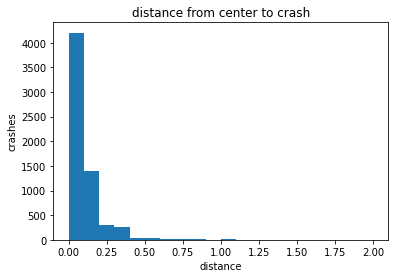

In [ ]:
plt.title('distance from center to crash')
plt.hist(accidents.distance_crash_to_center, bins=20);
plt.xlabel('distance')
plt.ylabel('crashes');

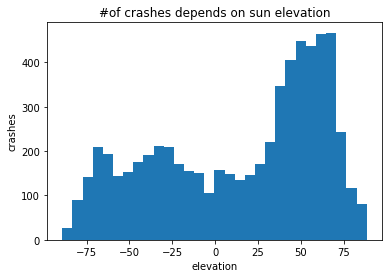

In [ ]:
plt.title('#of crashes depends on sun elevation')
plt.hist(accidents.elevation, bins=30);
plt.xlabel('elevation')
plt.ylabel('crashes');

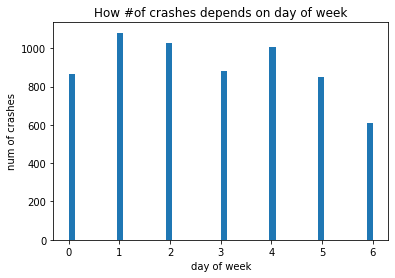

In [ ]:
plt.title('How #of crashes depends on day of week')
plt.hist(accidents.day_of_week, bins=50)
plt.xlabel('day of week')
plt.ylabel('num of crashes')
plt.show()

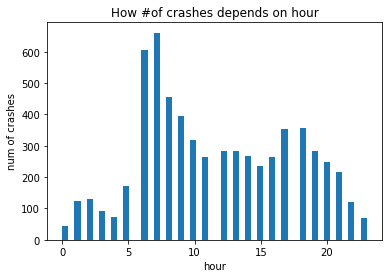

In [ ]:
plt.title('How #of crashes depends on hour')
plt.hist(accidents.hour, bins=50)
plt.xlabel('hour')
plt.ylabel('num of crashes')
plt.show()

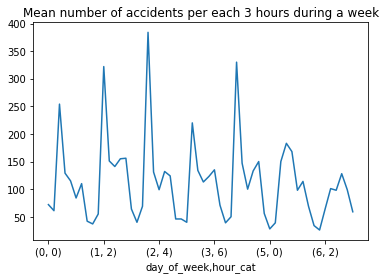

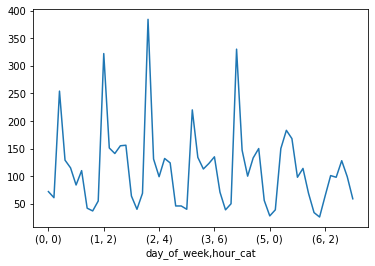

In [ ]:
accidents['hour_cat']=accidents['hour']//3

gp=accidents.groupby(['day_of_week','hour_cat']).size()
gp.plot(title = "Mean number of accidents per each 3 hours during a week")
plt.show()

At weekends there are less crashes

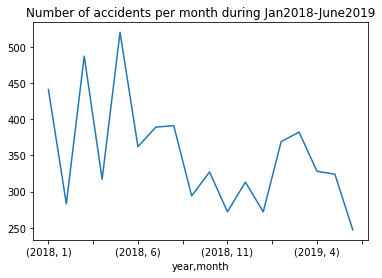

In [ ]:
gp=accidents.groupby(['year','month']).size()
gp.plot(title="Number of accidents per month during Jan2018-June2019")
plt.show()


In automn and winter there are less crashes

In [ ]:
!pip install folium

visualize map with crashes

In [ ]:
import folium
world_map = folium.Map(location = [float(location['lat']), float(location['lon'])], zoom_start=16)

incidents = folium.map.FeatureGroup()
# machines = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(accidents.latitude, accidents.longitude):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.2
        )
    )

world_map.add_child(incidents)
world_map

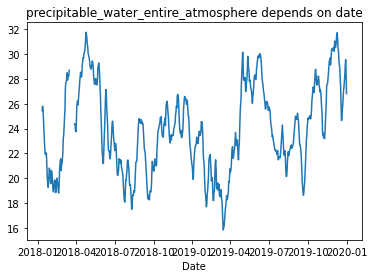

In [ ]:
weather.set_index('Date')['precipitable_water_entire_atmosphere'].rolling(10).mean().plot()
plt.title('precipitable_water_entire_atmosphere depends on date');

Interestingly, Kenya has two rainy seasons per year!

## Clusterization

We tried different variants of clustering algorithms.

1.   **Kmeans (`latitude` and `longitude`)**
2.   **Kmeans with `date`**

    *Group accidents by (0,1,2) , (3, 4,5) , ... hours and then clusterize inside of each cluster*

3. **Gaussian mixture: different variants**



### Kmeans

In [ ]:
# Load the data
df = pd.read_csv('drive/My Drive/ds project/Data/Train.csv', parse_dates=['datetime'])

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=6, random_state=1).fit(df[df.columns[2:4]])
labels = kmeans.predict(df[df.columns[2:4]])

df['clusters'] = kmeans.labels_
centers = kmeans.cluster_centers_

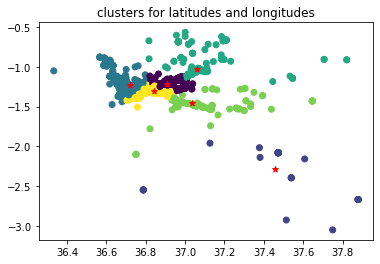

In [ ]:
plt.title('clusters for latitudes and longitudes')
plt.scatter(df['longitude'], df['latitude'], c=labels)
plt.scatter(centers[:, 1], centers[:, 0], c="red", marker="*")
plt.show()

In [ ]:
# Test set
reference = df.loc[df.datetime > '2019-01-01'] # Using 2019 as our test set

# Date rane covering test set
dates = pd.date_range('2019-01-01', '2020-01-01', freq='3h')

# Create submission dataframe
sub = pd.DataFrame({
    'date':dates
})
for ambulance in range(6):
    sub['A'+str(ambulance)+'_Latitude'] = centers[ambulance][0]
    sub['A'+str(ambulance)+'_Longitude'] = centers[ambulance][1]

score(sub, reference)

105.54000827380955

### Kmeans over time

In [ ]:
# Add hour feature to dataset
from datetime import datetime

hour = []
for i in tqdm(range(df.shape[0])):
    d1 = datetime.strptime(str(df['datetime'].iloc[i]), "%Y-%m-%d %H:%M:%S")
    hour.append(d1.hour)
df['hour'] = hour

100%|██████████| 6318/6318 [00:00<00:00, 12239.57it/s]


In [ ]:
# group crashes by hours
idx1=(df.hour==0)|(df.hour==1)|(df.hour==2)
idx2=(df.hour==3)|(df.hour==4)|(df.hour==5)
idx3=(df.hour==6)|(df.hour==7)|(df.hour==8)
idx4=(df.hour==9)|(df.hour==10)|(df.hour==11)
idx5=(df.hour==12)|(df.hour==13)|(df.hour==14)
idx6=(df.hour==15)|(df.hour==16)|(df.hour==17)
idx7=(df.hour==18)|(df.hour==19)|(df.hour==20)
idx8=(df.hour==21)|(df.hour==22)|(df.hour==23)

In [ ]:
idx = [idx1, idx2, idx3, idx4, idx5, idx6, idx7, idx8]
dataframes = [df[idx1].copy(), df[idx2].copy(), df[idx3].copy(), df[idx4].copy(), df[idx5].copy(), df[idx6].copy(), df[idx7].copy(), df[idx8].copy()]

In [ ]:
for i in range(len(dataframes)):
  kmeans = KMeans(n_clusters=6, random_state=1).fit(dataframes[i][dataframes[i].columns[2:4]])
  labels = kmeans.predict(dataframes[i][dataframes[i].columns[2:4]])
  dataframes[i]['clusters'] = labels

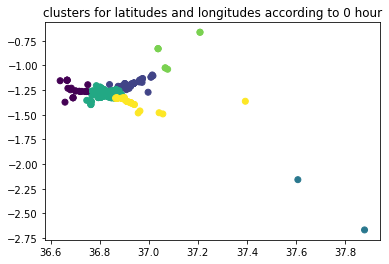

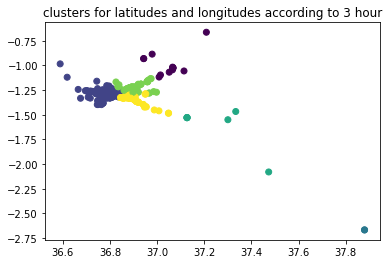

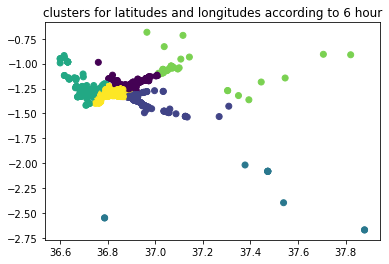

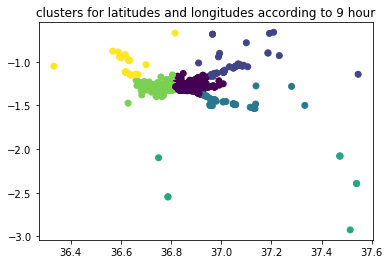

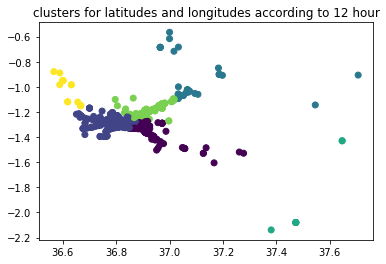

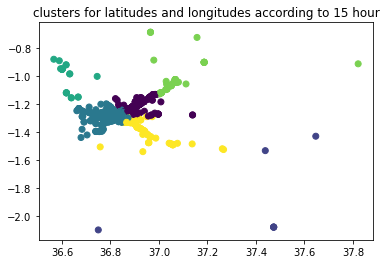

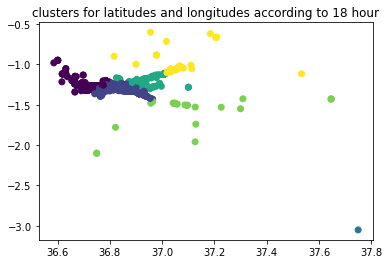

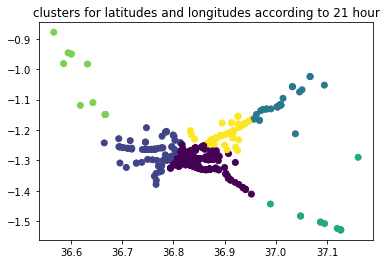

In [ ]:
for i in range(len(dataframes)):
  plt.title('clusters for latitudes and longitudes according to {} hour'.format(i*3))
  plt.scatter(dataframes[i]['longitude'], dataframes[i]['latitude'], c=dataframes[i]['clusters'])
  plt.show()

In [ ]:
def get_ambulance_lat_by_hour(hour_column, ambulance):
  lat_column = [list(dataframes[hour//3].groupby('clusters')['latitude'].mean())[ambulance] for hour in hour_column]
  return lat_column

def get_ambulance_long_by_hour(hour_column, ambulance):
  long_column = [list(dataframes[hour//3].groupby('clusters')['longitude'].mean())[ambulance] for hour in hour_column]
  return long_column

In [ ]:
reference = df.loc[df.datetime > '2019-01-01'] # Using 2019 as our test set

# Date rane covering test set
dates = pd.date_range('2019-01-01', '2020-01-01', freq='3h')

# Create submission dataframe
sub = pd.DataFrame({
    'date':dates
})
hour = []
for i in tqdm(range(sub.shape[0])):
    d1 = datetime.strptime(str(sub['date'].iloc[i]), "%Y-%m-%d %H:%M:%S")
    hour.append(d1.hour)
sub['hour'] = hour


for ambulance in range(6):
#     # clusterize by hour and lat/long
    sub['A'+str(ambulance)+'_Latitude'] = get_ambulance_lat_by_hour(list(sub.hour), ambulance)
    sub['A'+str(ambulance)+'_Longitude'] = get_ambulance_long_by_hour(list(sub.hour), ambulance)

score(sub, reference)

100%|██████████| 2921/2921 [00:00<00:00, 12596.98it/s]


103.01097219962719

In [ ]:
def plot_for_hour(ref, sub, hour):
  plt.title('Crashes and ambulances for {} hour'.format(hour))
  colors = ['black', 'r', 'orange', 'g', 'b', 'violet']
  for i in range(6):
    latitude = 'A'+str(i)+'_Latitude'
    longitude = 'A'+str(i)+'_Longitude'
    plt.scatter(x=sub[sub.hour==hour][latitude], y=sub[sub.hour==hour][longitude], marker="x",color=colors[i],label='Amb#{}'.format(i),s=100)
  plt.scatter(x=reference[reference.hour==hour].latitude, y=reference[reference.hour==hour].longitude, marker=".",color='y',label='Crash',s=10)
  plt.xlabel('latitude')
  plt.ylabel('longitude')
  plt.legend()
  plt.show()

  0%|          | 0/8 [00:00<?, ?it/s]

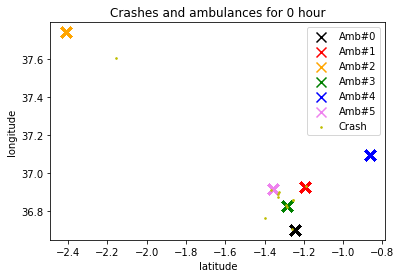

 12%|█▎        | 1/8 [00:00<00:01,  3.93it/s]

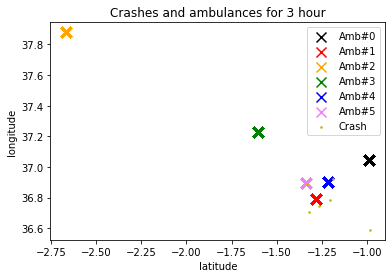

 25%|██▌       | 2/8 [00:00<00:01,  3.97it/s]

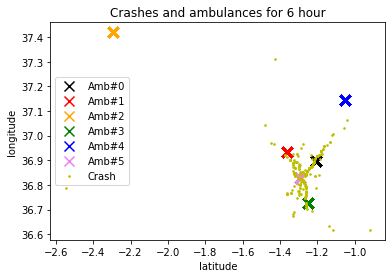

 38%|███▊      | 3/8 [00:00<00:01,  3.84it/s]

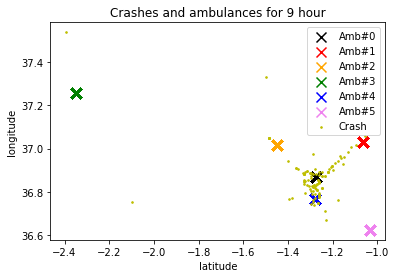

 50%|█████     | 4/8 [00:01<00:01,  3.96it/s]

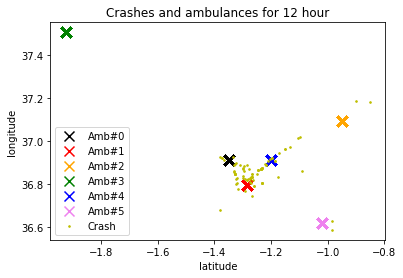

 62%|██████▎   | 5/8 [00:01<00:00,  3.99it/s]

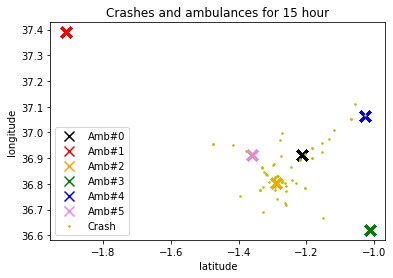

 75%|███████▌  | 6/8 [00:01<00:00,  3.83it/s]

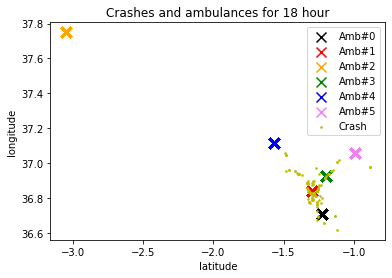

 88%|████████▊ | 7/8 [00:01<00:00,  3.93it/s]

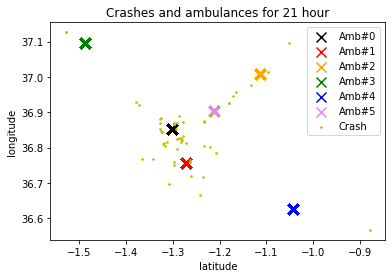

100%|██████████| 8/8 [00:02<00:00,  3.94it/s]


In [ ]:
for i in tqdm(range(0,24,3)):
  plot_for_hour(reference, sub, i)

### Gaussian Mixture

In [ ]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=6, covariance_type='full', random_state=134)

# Select data
x = df[["latitude", "longitude"]]

# Fit the model
gmm.fit(x)

# Get clusters
y_pred = gmm.predict(x)

# Initialize the submission DataFrame
#sub = sample_sub()
# Create submission dataframe
sub = pd.DataFrame({
    'date':dates
})

# Populate the submission DataFrame
for ambulance in range(6):
    sub['A'+str(ambulance)+'_Latitude'] = gmm.means_[ambulance, 0]
    sub['A'+str(ambulance)+'_Longitude'] = gmm.means_[ambulance, 1]

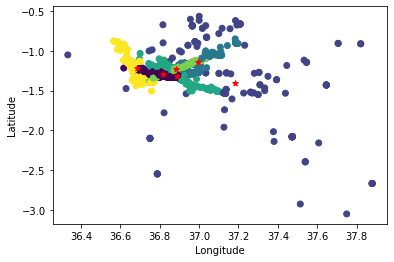

In [ ]:
# Visualize the clusters and their centers
plt.scatter(df["longitude"], df["latitude"], c=y_pred)
plt.scatter(gmm.means_[:, 1], gmm.means_[:, 0], c="red", marker="*")
plt.xlabel("Longitude")
plt.ylabel("Latitude");

In [ ]:

score(sub, reference)

102.9932254119498

Show on map

In [ ]:
world_map = folium.Map(location = [float(location['lat']), float(location['lon'])], zoom_start=8)

incidents = folium.map.FeatureGroup()
machines = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(accidents.latitude, accidents.longitude):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.2
        )
    )

gmm_lat = gmm.means_[:,0]
gmm_long = gmm.means_[:,1]

for lat, lng, in zip(gmm_lat, gmm_long):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.2
        )
    )


world_map.add_child(incidents)
world_map.add_child(machines)
world_map

**Results on clusterization:**


1.   Kmeans basic: 105.54
2.   Kmeans with time: 103
3.   Gaussian mixture: 102.99

To improve results we can modify the algorithm. We should take all locations of previous accidents, predict probabilities of crashes with XGBoost and then clusterize them.

## XGBoost & Clustering

### Loading data of non accidents generated in another file

The examples were generated by changing timestamps for known (latitudes, longitudes) and adding some noise to latitudes and longitudes. It will be better for future to change also segments.

In [ ]:
# Load the data of non accidents obtained in another notebook 
non_accidents = pd.read_csv('drive/My Drive/ds project/Data/non_accidents.csv')
non_accidents.drop(['fid','target'], axis=1, inplace=True)
non_accidents.rename(columns={'timestamp':'datetime'}, inplace=True)
non_accidents.datetime = pd.to_datetime(non_accidents.datetime)

non_accidents

,datetime,latitude,longitude
0,2018-01-01 00:00:00,-1.431314,36.830149
1,2018-01-01 00:00:00,-1.227402,36.691137
2,2018-01-01 00:00:00,-1.061538,36.748851
3,2018-01-01 00:00:00,-0.593151,37.094150
4,2018-01-01 01:00:00,-1.296987,36.771268
...,...,...,...
37903,2019-12-31 20:00:00,-1.031810,36.740328
37904,2019-12-31 21:00:00,-1.287815,36.833578
37905,2019-12-31 21:00:00,-1.364184,36.752753
37906,2019-12-31 23:00:00,-1.222813,36.812800


Take only k times larger dataset without accidents than the dataset with accidents 

Now we took 6 times larger, as suggested in 
https://medium.com/geoai/using-machine-learning-to-predict-car-accident-risk-4d92c91a7d57 

In [ ]:
non_accidents = non_accidents[:accidents.shape[0]*6]
print(non_accidents.shape[0])

37908


In [ ]:
# Add features to the DataFrame
add_date_time_features(non_accidents)
add_holiday_feature(non_accidents)
add_center_feature(non_accidents)
distance_to_center_feature(non_accidents)
#add_road_feature(non_accidents)
add_zenith_azimuth_elevation_feature(non_accidents)
full_table_non_accidents = add_weather_feature(non_accidents, weather)

full_table_non_accidents

100%|██████████| 37908/37908 [00:05<00:00, 6415.99it/s]


,latitude,longitude,year,month,day,hour,minute,second,day_of_week,is_day_off,national_holiday,center_lat,center_long,distance_crash_to_center,elevation,azimuth,zenith,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,v_component_of_wind_10m_above_ground
0,-1.431314,36.830149,2018,1,1,0,0,0,0,0,1,-1.283253,36.817245,0.148622,-47.381302,127.017968,137.381302,24.1,72.700005,0.009560,15.161493,-0.012186,-0.933914
1,-1.227402,36.691137,2018,1,1,0,0,0,0,0,1,-1.283253,36.817245,0.137922,-47.381302,127.017968,137.381302,24.1,72.700005,0.009560,15.161493,-0.012186,-0.933914
2,-1.061538,36.748851,2018,1,1,0,0,0,0,0,1,-1.283253,36.817245,0.232025,-47.381302,127.017968,137.381302,24.1,72.700005,0.009560,15.161493,-0.012186,-0.933914
3,-0.593151,37.094150,2018,1,1,0,0,0,0,0,1,-1.283253,36.817245,0.743584,-47.381302,127.017968,137.381302,24.1,72.700005,0.009560,15.161493,-0.012186,-0.933914
4,-1.296987,36.771268,2018,1,1,1,0,0,0,0,1,-1.283253,36.817245,0.047984,-34.795069,119.462832,124.795069,24.1,72.700005,0.009560,15.161493,-0.012186,-0.933914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37903,-1.031810,36.740328,2019,12,31,20,0,0,1,0,0,-1.283253,36.817245,0.262945,-56.280466,222.290390,146.280466,16.5,85.000000,0.010974,14.947778,-1.415813,-2.028264
37904,-1.287815,36.833578,2019,12,31,21,0,0,1,0,0,-1.283253,36.817245,0.016959,-64.130997,199.167922,154.130997,16.5,85.000000,0.010974,14.947778,-1.415813,-2.028264
37905,-1.364184,36.752753,2019,12,31,21,0,0,1,0,0,-1.283253,36.817245,0.103484,-64.130997,199.167922,154.130997,16.5,85.000000,0.010974,14.947778,-1.415813,-2.028264
37906,-1.222813,36.812800,2019,12,31,23,0,0,1,0,0,-1.283253,36.817245,0.060604,-58.185371,141.210015,148.185371,16.5,85.000000,0.010974,14.947778,-1.415813,-2.028264


### Concatenating dataframes with accidents and non accidents

In [ ]:
full_table_accidents.drop('uid', axis=1, inplace=True)

In [ ]:
full_table_accidents['target'] = [1]*full_table_accidents.shape[0]
full_table_non_accidents['target'] = [0]*full_table_non_accidents.shape[0]

In [ ]:
df = pd.concat([full_table_accidents, full_table_non_accidents], axis=0, ignore_index=True)

In [ ]:
df.head()

,latitude,longitude,year,month,day,hour,minute,second,day_of_week,is_day_off,national_holiday,center_lat,center_long,distance_crash_to_center,elevation,azimuth,zenith,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,v_component_of_wind_10m_above_ground,target
0,-1.188850,36.931382,2018,1,1,0,25,46,0,0,1,-1.283253,36.817245,0.148120,-42.109624,123.196769,132.109624,24.1,72.700005,0.00956,15.161493,-0.012186,-0.933914,1
1,-0.662939,37.208730,2018,1,1,2,2,39,0,0,1,-1.283253,36.817245,0.733519,-20.862299,115.280604,110.862299,24.1,72.700005,0.00956,15.161493,-0.012186,-0.933914,1
2,-0.662939,37.208730,2018,1,1,2,31,49,0,0,1,-1.283253,36.817245,0.733519,-14.233281,114.149520,104.233281,24.1,72.700005,0.00956,15.161493,-0.012186,-0.933914,1
3,-1.288087,36.826583,2018,1,1,3,4,1,0,0,1,-1.283253,36.817245,0.010515,-6.842674,113.361196,96.842674,24.1,72.700005,0.00956,15.161493,-0.012186,-0.933914,1
4,-1.188850,36.931382,2018,1,1,3,58,49,0,0,1,-1.283253,36.817245,0.148120,5.850154,112.993894,84.149846,24.1,72.700005,0.00956,15.161493,-0.012186,-0.933914,1


Shuffle accidents and non accidents data

In [ ]:
# shuffle the DataFrame rows 
df_shuffle = df.sample(frac = 1) 

In [ ]:
df_shuffle

,latitude,longitude,year,month,day,hour,minute,second,day_of_week,is_day_off,national_holiday,center_lat,center_long,distance_crash_to_center,elevation,azimuth,zenith,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,v_component_of_wind_10m_above_ground,target
2746,-1.274934,36.823417,2018,7,27,8,28,54,4,0,0,-1.283253,36.817245,0.010359,63.211785,39.329440,26.788215,21.500000,81.071823,0.008758,12.237756,-0.555188,-0.568972,1
3252,-1.326507,36.895067,2018,9,8,12,54,24,5,1,0,-1.283253,36.817245,0.089035,38.651595,278.197104,51.348405,18.900000,85.800003,0.011005,14.749994,-3.555999,-0.662363,1
22702,-1.243244,36.709831,2018,8,16,0,0,0,3,0,0,-1.283253,36.817245,0.114623,-52.531272,68.687307,142.531272,19.800001,84.806534,0.010310,13.982782,-1.972666,0.825854,0
28629,-1.243995,37.001177,2018,11,6,6,0,0,1,0,0,-1.283253,36.817245,0.188075,39.481061,109.754822,50.518939,20.002310,82.110374,0.010534,14.727502,-2.744482,-2.241802,0
2822,-1.217978,36.896297,2018,8,3,9,28,54,4,0,0,-1.283253,36.817245,0.102519,71.093634,7.456639,18.906366,16.300001,82.524979,0.009970,13.850000,-1.133943,-1.455767,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19026,-1.209068,36.816268,2018,6,25,10,0,0,0,0,0,-1.283253,36.817245,0.074192,64.630500,346.754554,25.369500,27.400000,79.800003,0.009987,14.432886,0.171536,0.540984,0
35859,-1.282950,36.951072,2019,3,27,20,0,0,2,0,0,-1.283253,36.817245,0.133828,-65.439441,273.741222,155.439441,21.747694,58.859077,0.008970,17.492181,-3.126670,-2.282383,0
5018,-1.328157,36.870764,2019,2,27,8,27,7,2,0,0,-1.283253,36.817245,0.069861,69.217419,110.657667,20.782581,10.800000,59.024960,0.008258,16.083337,-2.861602,-2.914805,1
24736,-1.231085,36.626473,2018,9,13,15,0,0,3,0,0,-1.283253,36.817245,0.197776,7.200051,273.844525,82.799949,17.200001,81.395065,0.010350,14.568292,-3.497455,-1.306458,0


### Preprocess data for the model

In [ ]:
cat_columns = ['year', 'month','day','hour','is_day_off','national_holiday', 'day_of_week']
df_shuffle = pd.get_dummies(df_shuffle, columns = cat_columns)

In [ ]:
df_shuffle.drop(['minute', 'second'], axis=1, inplace=True)

In [ ]:
Y = df_shuffle['target']
df_shuffle.drop('target', axis=1, inplace=True)
X = df_shuffle

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y.values, test_size=0.10, random_state=42)

In [ ]:
scaler_features = list(X.columns[:14])
scaler_features

['latitude',
 'longitude',
 'center_lat',
 'center_long',
 'distance_crash_to_center',
 'elevation',
 'azimuth',
 'zenith',
 'precipitable_water_entire_atmosphere',
 'relative_humidity_2m_above_ground',
 'specific_humidity_2m_above_ground',
 'temperature_2m_above_ground',
 'u_component_of_wind_10m_above_ground',
 'v_component_of_wind_10m_above_ground']

In [ ]:
from sklearn import preprocessing
scaler = preprocessing.StandardScaler()

X_train.loc[:,scaler_features] = scaler.fit_transform(X_train[scaler_features])
X_test.loc[:,scaler_features] = scaler.transform(X_test[scaler_features])

### Create the model

In [ ]:
import xgboost
from sklearn.model_selection import  GridSearchCV, StratifiedKFold, KFold,StratifiedShuffleSplit
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score,roc_auc_score, roc_curve, average_precision_score,precision_recall_curve

In [ ]:
import numpy as np
feature_names = X_train.columns.tolist()
feature_sel = range(len(feature_names))
fnames = np.array(feature_names)[feature_sel]

In [ ]:
dtrain = xgboost.DMatrix(X_train,label=y_train,feature_names=fnames)
dtest =  xgboost.DMatrix(X_test,label=y_test,feature_names=fnames)


params = {
    'max_depth':3,
    'min_child_weight': 4.0,
    'reg_lambda': 1.0,
    'reg_alpha':0.0,
    'scale_pos_weight':1.0,
    'eval_metric':'auc',
    'objective':'binary:logistic',
    'eta':0.5
}

In [ ]:
booster = xgboost.train(params,dtrain,
    evals = [(dtest, 'eval')],
    num_boost_round=3000,
    early_stopping_rounds=25
)

[0]	eval-auc:0.784806
Will train until eval-auc hasn't improved in 25 rounds.
[1]	eval-auc:0.807572
[2]	eval-auc:0.82224
[3]	eval-auc:0.833194
[4]	eval-auc:0.836419
[5]	eval-auc:0.84285
[6]	eval-auc:0.847505
[7]	eval-auc:0.856526
[8]	eval-auc:0.861982
[9]	eval-auc:0.8643
[10]	eval-auc:0.867004
[11]	eval-auc:0.877078
[12]	eval-auc:0.881354
[13]	eval-auc:0.884048
[14]	eval-auc:0.88446
[15]	eval-auc:0.885486
[16]	eval-auc:0.891147
[17]	eval-auc:0.89295
[18]	eval-auc:0.892624
[19]	eval-auc:0.893385
[20]	eval-auc:0.898603
[21]	eval-auc:0.899429
[22]	eval-auc:0.902155
[23]	eval-auc:0.902574
[24]	eval-auc:0.909906
[25]	eval-auc:0.912469
[26]	eval-auc:0.920531
[27]	eval-auc:0.921501
[28]	eval-auc:0.927454
[29]	eval-auc:0.927648
[30]	eval-auc:0.927848
[31]	eval-auc:0.929153
[32]	eval-auc:0.933351
[33]	eval-auc:0.93367
[34]	eval-auc:0.934525
[35]	eval-auc:0.934763
[36]	eval-auc:0.936923
[37]	eval-auc:0.937227
[38]	eval-auc:0.938316
[39]	eval-auc:0.938845
[40]	eval-auc:0.939408
[41]	eval-auc:0.94

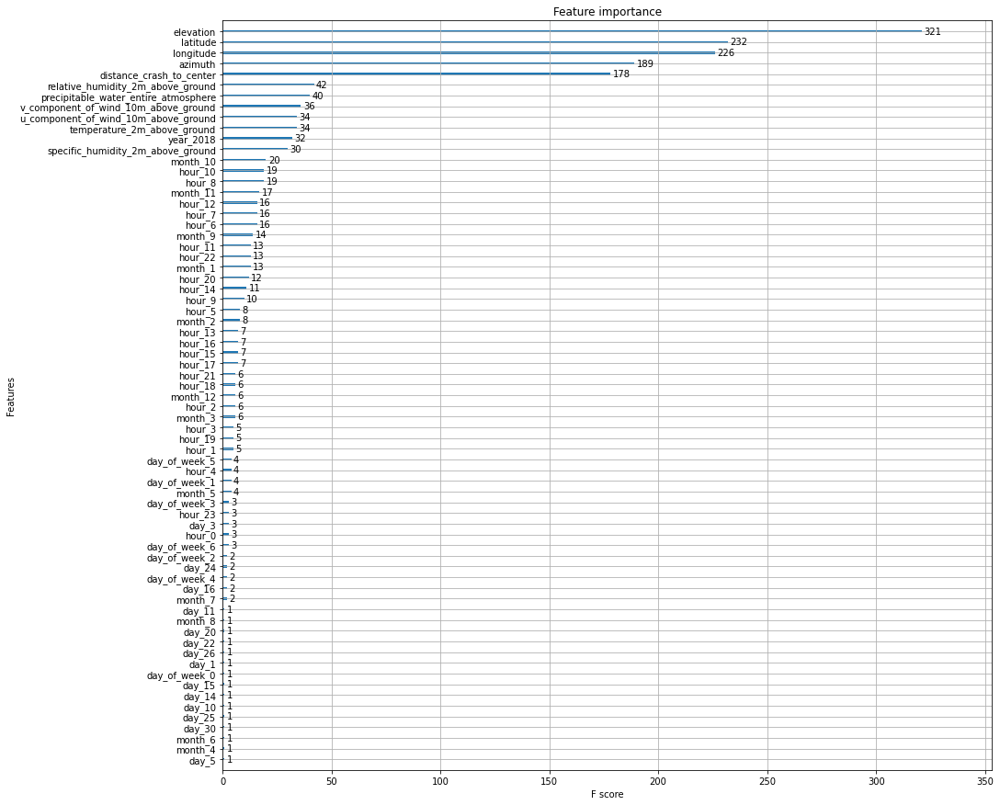

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,15))
xgboost.plot_importance(booster,ax=plt.gca(),importance_type='weight')

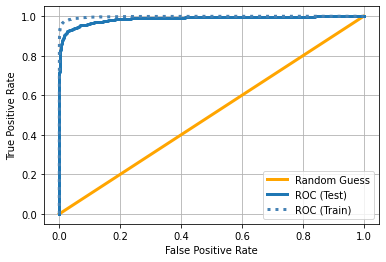

In [ ]:
y_pred_test = booster.predict(dtest)

fpr, tpr, thresholds = roc_curve(y_test,y_pred_test)

y_pred_train = booster.predict(dtrain)
fpr_train, tpr_train, thresholds_train = roc_curve(y_train,y_pred_train)
fig,ax = plt.subplots()
plt.plot([0,1],[0,1],'r-',label='Random Guess',color='orange',lw=3)
plt.plot(fpr,tpr,label='ROC (Test)',lw=3)
plt.plot(fpr_train,tpr_train,'r:',label='ROC (Train)',color='steelblue',lw=3)
plt.grid()
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()

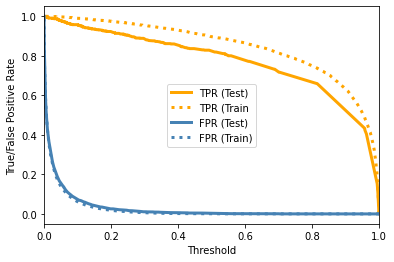

In [ ]:


plt.plot(thresholds,tpr,'r-',label='TPR (Test)',color='orange',lw=3)
plt.plot(thresholds_train,tpr_train,'r:',label='TPR (Train',color='orange',lw=3)
plt.plot(thresholds,fpr,'r-',label='FPR (Test)',color='steelblue',lw=3)
plt.plot(thresholds_train,fpr_train,'r:',label='FPR (Train)',color='steelblue',lw=3)
plt.gca().set_xbound(lower=0,upper=1)
plt.xlabel('Threshold')
plt.ylabel('True/False Positive Rate')
plt.legend()



In [ ]:
y_pred_test = booster.predict(dtest) > 0.19
print ('Test Accuracy:',accuracy_score(y_test,y_pred_test))
print ('Test F1:',f1_score(y_test,y_pred_test))
print ('Test Precision:',precision_score(y_test,y_pred_test))
print ('Test Recall:',recall_score(y_test,y_pred_test))
y_pred_test = booster.predict(dtest)
print ('Test AUC:',roc_auc_score(y_test,y_pred_test))
print ('Test AP:',average_precision_score(y_test,y_pred_test))

y_pred_train = booster.predict(dtrain) > 0.19
print ('Train Accuracy:',accuracy_score(y_train,y_pred_train))
print ('Train F1:',f1_score(y_train,y_pred_train))
print ('Train Precision:',precision_score(y_train,y_pred_train))
print ('Train Recall:',recall_score(y_train,y_pred_train))
y_pred_train = booster.predict(dtrain)
print ('Train AUC:',roc_auc_score(y_train,y_pred_train))
print ('Test AP:',average_precision_score(y_train,y_pred_train))

Test Accuracy: 0.9645037304996609
Test F1: 0.8818660647103085
Test Precision: 0.8443804034582133
Test Recall: 0.9228346456692913
Test AUC: 0.987199943460077
Test AP: 0.9611388358023981
Train Accuracy: 0.9788709393764289
Train F1: 0.9295231710382971
Train Precision: 0.88736
Train Recall: 0.9758930142530353
Train AUC: 0.9975368269941469
Test AP: 0.9908241065511187


In [ ]:
np.unique(y_test, return_counts=True)

(array([0, 1]), array([3788,  635]))

**This Looks very suspicious ...**

Maybe it´s so because not enough examples of crashes are presented in this competition 

### Create test dataset with mapping for each (latitude, longitude) timestamp 


In [ ]:
from datetime import datetime, timedelta

first_date = datetime.strptime('2019-07-01 00:00:01', "%Y-%m-%d %H:%M:%S")

last_date = datetime.strptime('2019-07-01 03:00:00', "%Y-%m-%d %H:%M:%S")                

In [ ]:
def get_time_range(first, last, delta_hrs=1):
    out = []
    ti = first
    while ti < last:
        out.append(ti)
        ti+=timedelta(hours=delta_hrs)
    return out

In [ ]:
get_time_range(first_date, last_date)

[datetime.datetime(2019, 7, 1, 0, 0, 1),
 datetime.datetime(2019, 7, 1, 1, 0, 1),
 datetime.datetime(2019, 7, 1, 2, 0, 1)]

### Prepare data for trained XGBoost

In [ ]:
accidents_0 = pd.read_csv('drive/My Drive/ds project/Data/Train.csv', parse_dates=['datetime'])
accidents = accidents_0.copy()
accidents['datetime'] = first_date
for i in get_time_range(first_date, last_date)[1:]:
    accidents1 = accidents_0.copy()
    accidents1['datetime'] = i
    accidents = pd.concat([accidents, accidents1])
accidents.reset_index(inplace=True)     
accidents_0 = accidents.copy()                    

In [ ]:
add_date_time_features(accidents)
add_holiday_feature(accidents)
add_center_feature(accidents) 
distance_to_center_feature(accidents)
add_zenith_azimuth_elevation_feature(accidents)
df = add_weather_feature(accidents, weather)
df.drop(['minute','second'],axis=1,inplace=True)

100%|██████████| 18954/18954 [00:02<00:00, 6462.83it/s]


In [ ]:
accidents.drop(columns=cat_columns+['minute', 'second', 'datetime', 'index', 'uid', 'Date'],
               inplace=True)

In [ ]:
# x test - accidents
# x train is 
for c in X_train.columns:
    if c not in accidents.columns:
        accidents[c] = 0

In [ ]:
X_test = accidents
X_test.loc[:,scaler_features] = scaler.transform(X_test[scaler_features])

### Try to predict probability of crashes

In [ ]:
X_test = accidents
feature_names = X_test.columns.tolist()
feature_sel = range(len(feature_names))
fnames = np.array(feature_names)[feature_sel]

dtest =  xgboost.DMatrix(X_test, feature_names=fnames)

In [ ]:
y_pred_test_hand = booster.predict(dtest)

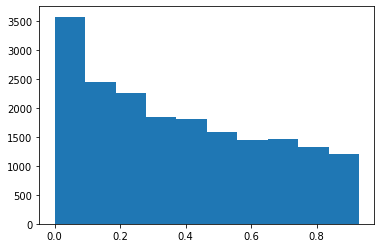

In [ ]:
plt.hist(y_pred_test_hand);

**XGBoost** predict probabilities of crashes on provided locations. Based on this information we could include only locations with highest degree of confidence and clusterize them.

**XGBoost** approach give us better understanding on feature importance and could be a good choice in building a comlex model like XGBoost+clusterization with more amount of data

In [ ]:
accidents_0.drop('index',axis=1,inplace=True)

In [ ]:
predicted_accidents = accidents_0[y_pred_test_hand>0.6]
print(predicted_accidents.shape)
predicted_accidents.to_csv('predicted_accidents.csv')

(4787, 4)


In [ ]:
predicted_accidents.head()

,uid,datetime,latitude,longitude
3,4,2019-07-01 00:00:01,-1.288087,36.826583
10,11,2019-07-01 00:00:01,-1.282547,36.827234
15,16,2019-07-01 00:00:01,-1.264331,36.746984
16,17,2019-07-01 00:00:01,-1.264267,36.746985
17,18,2019-07-01 00:00:01,-1.329837,36.855810


In [ ]:
gmm = GaussianMixture(n_components=6, covariance_type='full', random_state=134)

# Select data
x = predicted_accidents[["latitude", "longitude"]]

# Fit the model
gmm.fit(x)

# Get clusters
y_pred = gmm.predict(x)

# Initialize the submission DataFrame
#sub = sample_sub()
# Create submission dataframe
sub = pd.DataFrame({
    'date':dates
})

# Populate the submission DataFrame
for ambulance in range(6):
    sub['A'+str(ambulance)+'_Latitude'] = gmm.means_[ambulance, 0]
    sub['A'+str(ambulance)+'_Longitude'] = gmm.means_[ambulance, 1]

In [ ]:
world_map = folium.Map(location = [float(location['lat']), float(location['lon'])], zoom_start=8)
df = pd.read_csv('drive/My Drive/ds project/Data/Train.csv', parse_dates=['datetime'])
incidents = folium.map.FeatureGroup()
machines = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(df.latitude, df.longitude):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.2
        )
    )

gmm_lat = gmm.means_[:,0]
gmm_long = gmm.means_[:,1]

for lat, lng, in zip(gmm_lat, gmm_long):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.2
        )
    )


world_map.add_child(incidents)
world_map.add_child(machines)
world_map

In [ ]:
score(sub, reference)

98.75444680808941

**Rezults:**


1.   Clusterization: 102.99
2.   XGBoost+clusterization: 98.75



In this example we showed how to generate predictions of accidents for 3 first hours of 1st July 2019 and clusterize these predictions. For final submission we should repeat these steps for each 3 hours from 1st July 2019 till 31 Dec 2019. 

Also we could improve our predictions using more data of crashes and generating non crashes with the help of information from segments.

